# LE-DPO Intent Embeddings — UMAP Visualisation

Loads LE-DPO model intent generations from the **test** eval sets, embeds them with `sentence-transformers/all-MiniLM-L6-v2` (cached on disk), projects to 2D via UMAP, and plots a scatter coloured by dataset.

Reusable helpers live in `src/intention_jailbreak/embeddings/`:
- `load_intent_predictions` — walks `<predictions_dir>/<dataset>/*.jsonl`
- `embed_texts` — sentence-transformer encode + `.npy` cache + tqdm bar
- `pca_project` / `umap_project` — 2D projections

In [1]:
%load_ext autoreload
%autoreload 2

from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np

from intention_jailbreak.embeddings import (
    DEFAULT_MODEL,
    DEFAULT_TEST_DATASETS,
    embed_texts,
    load_intent_predictions,
    umap_project,
)

REPO_ROOT = Path.cwd()
while not (REPO_ROOT / "pyproject.toml").exists():
    REPO_ROOT = REPO_ROOT.parent

LE_DPO_PREDICTIONS_DIR = (
    REPO_ROOT
    / "data/safety_experiment/dpo/llama31-8b-k10-e-hard-b03-e3-s22"
)
CACHE_DIR = REPO_ROOT / "data/embedding_cache/intent_pca"

print(f"Predictions: {LE_DPO_PREDICTIONS_DIR}")
print(f"Cache:       {CACHE_DIR}")
print(f"Datasets:    {list(DEFAULT_TEST_DATASETS)}")

Predictions: /scratch/s4626451/intention-jailbreak/data/safety_experiment/dpo/llama31-8b-k10-e-hard-b03-e3-s22
Cache:       /scratch/s4626451/intention-jailbreak/data/embedding_cache/intent_pca
Datasets:    ['aegis', 'annotated-intents', 'openai-moderation', 'toxic-chat', 'wildguardmix', 'xstest']


## 1. Load intents

In [2]:
# `annotated-intents` is the in-distribution WildGuard test set — exclude it so
# the plot only shows the external OOD benchmark suites.
PLOT_DATASETS = [d for d in DEFAULT_TEST_DATASETS if d != "annotated-intents"]

df = load_intent_predictions(LE_DPO_PREDICTIONS_DIR, datasets=PLOT_DATASETS)
print(f"Loaded {len(df)} intents across {df['dataset'].nunique()} datasets")
df['dataset'].value_counts().sort_index()

Loaded 10876 intents across 5 datasets


dataset
aegis                1964
openai-moderation    1680
toxic-chat           5083
wildguardmix         1699
xstest                450
Name: count, dtype: int64

## 2. Embed (cached)

Cache key includes a content hash, so changing the inputs auto-invalidates the cache.

In [3]:
embeddings = embed_texts(
    df['intent'].tolist(),
    cache_dir=CACHE_DIR,
    model_name=DEFAULT_MODEL,
    cache_key='le_dpo_intents',
)
print(f"Embeddings shape: {embeddings.shape}")

Embeddings shape: (10876, 384)


## 3. Use all points

Subsampling masked the outlier tails. Use the full set; rely on the shuffled draw order + low alpha in the plot to keep no single dataset overpainting the rest.

In [4]:
RANDOM_SEED = 42

df_plot = df.reset_index(drop=True)
embeddings_plot = embeddings
print(f"Plotting all {len(df_plot)} points")
df_plot['dataset'].value_counts().sort_index()

Plotting all 10876 points


dataset
aegis                1964
openai-moderation    1680
toxic-chat           5083
wildguardmix         1699
xstest                450
Name: count, dtype: int64

## 4. UMAP to 2D

Cosine metric matches how sentence-transformers were trained. `n_neighbors=30` favours global structure; drop to ~15 for tighter local clusters.

In [5]:
projection, reducer = umap_project(
    embeddings_plot,
    n_components=2,
    n_neighbors=30,
    min_dist=0.1,
    metric='cosine',
    random_state=RANDOM_SEED,
)
df_plot['umap1'] = projection[:, 0]
df_plot['umap2'] = projection[:, 1]
print(f"Projection shape: {projection.shape}")

/scratch/s4626451/intention-jailbreak/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Projection shape: (10876, 2)


## 5. Plot — scatter by dataset (shuffled draw order)

Shuffle the per-point draw order rather than drawing one dataset at a time, so later groups don't sit on top of earlier ones.

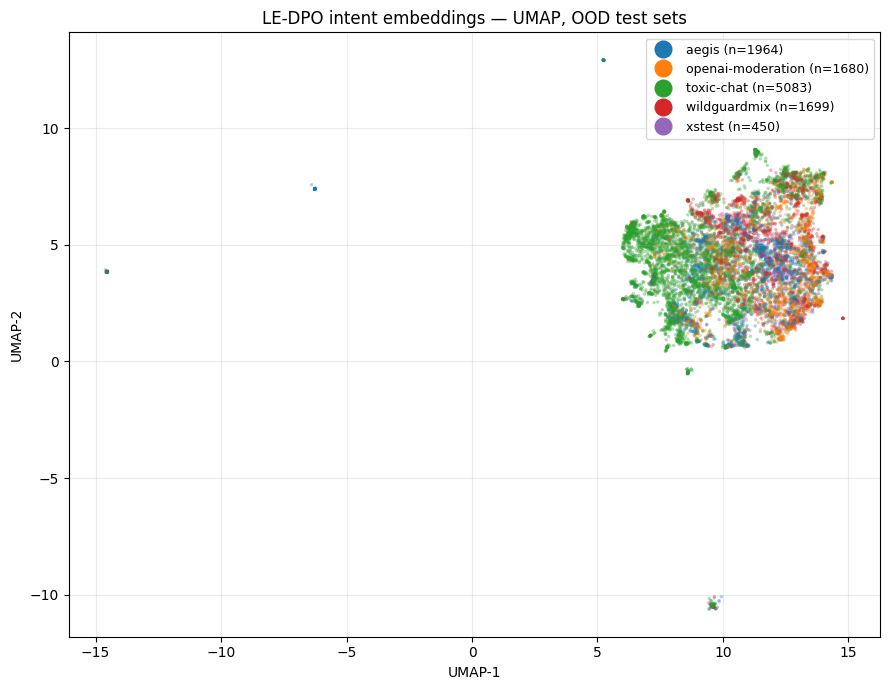

In [6]:
datasets = sorted(df_plot['dataset'].unique())
cmap = plt.get_cmap('tab10')
color_for = {ds: cmap(i % 10) for i, ds in enumerate(datasets)}

shuffled = df_plot.sample(frac=1.0, random_state=RANDOM_SEED).reset_index(drop=True)
point_colors = [color_for[d] for d in shuffled['dataset']]

fig, ax = plt.subplots(figsize=(9, 7))
ax.scatter(
    shuffled['umap1'], shuffled['umap2'],
    s=6, alpha=0.35, c=point_colors, linewidths=0,
)

handles = [
    plt.Line2D(
        [0], [0], marker='o', linestyle='', color=color_for[ds],
        label=f"{ds} (n={(df_plot['dataset'] == ds).sum()})",
    )
    for ds in datasets
]
ax.legend(handles=handles, loc='best', fontsize=9, markerscale=2.0)
ax.set_xlabel('UMAP-1')
ax.set_ylabel('UMAP-2')
ax.set_title('LE-DPO intent embeddings — UMAP, OOD test sets')
ax.grid(True, alpha=0.25)
plt.tight_layout()
plt.show()

## 6. Interactive plot — zoom + hover-to-see-intent

WebGL-backed scatter via plotly. Hover shows the intent + prompt; the legend doubles as a toggle (click a dataset to hide it, double-click to isolate).

In [10]:
from intention_jailbreak.embeddings import interactive_umap_plot_toggleable

fig = interactive_umap_plot_toggleable(
    df_plot,
    color_cols=('dataset', 'true_harm_binary', 'predicted_harm'),
    title='LE-DPO intent embeddings — UMAP, OOD test sets',
)
fig.show()